# **Usando modelos pré-treinados no PyTorch para obter precisão de Rank-1 e Rank-5**
1. Primeiro, carregaremos o modelo ImageNet VGG16 pré-treinado.
2. Obteremos as 5 principais classes a partir de uma única inferência de imagem.
3. Em seguida, construiremos uma função para nos fornecer a precisão de classificação N usando algumas imagens de teste.

In [2]:
# Load our pre-trained VGG16
import torchvision.models as models
import torch

model = models.vgg16(pretrained=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

c:\Anaconda\envs\modern\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Anaconda\envs\modern\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

## **Normalização**

Todos os modelos pré-treinados esperam imagens de entrada **normalizadas** da mesma forma, ou seja, mini-lotes de imagens RGB de 3 canais com formato (3 x H x W), onde H e W devem ter pelo menos 224. As imagens devem ser carregadas em um intervalo de [0, 1] e, em seguida, normalizadas usando média = [0,485, 0,456, 0,406] e desvio padrão = [0,229, 0,224, 0,225]. Você pode usar a seguinte transformação para normalizar:

`normalize = transforms.Normalize(mean=[0,485, 0,456, 0,406],
                                 std=[0,229, 0,224, 0,225])`


In [3]:
from torchvision import datasets, transforms, models

data_dir = '/images'

test_transforms = transforms.Compose([transforms.Resize((224,224)),
                                      transforms.ToTensor(),])

**NOTA**

```net.eval()``` é uma espécie de interruptor para algumas camadas/partes específicas do modelo que se comportam de maneira diferente durante o treinamento e a inferência (avaliação). Por exemplo, camadas Dropouts, camadas BatchNorm etc. Você precisa desativá-las durante a avaliação do modelo, e .eval() fará isso por você. Além disso, a prática comum para avaliação/validação é usar torch.no_grad() em conjunto com model.eval() para desativar o cálculo de gradientes:

Traduzido com a versão gratuita do tradutor - DeepL.com

In [4]:
model.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [5]:
import json
from PIL import Image
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

with open('imageNetclasses.json') as f:
  class_names = json.load(f)

# **Carregue e execute uma única imagem através do nosso modelo pré-treinado**

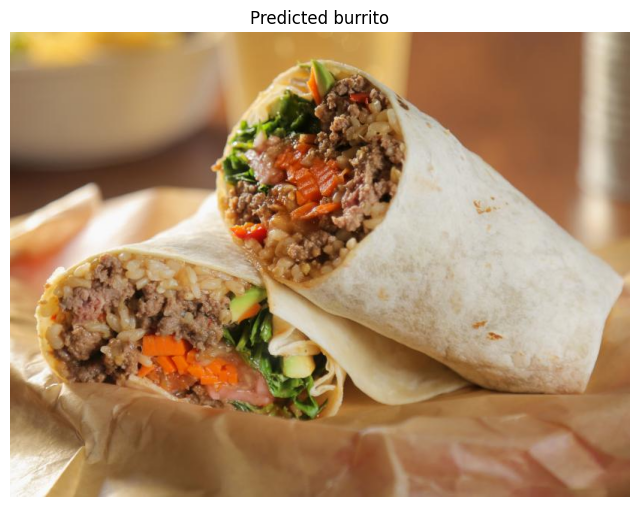

In [6]:
from PIL import Image
import numpy as np

image = Image.open('./images/class1/1539714414867.jpg')

# Convert to Tensor
image_tensor = test_transforms(image).float()
image_tensor = image_tensor.unsqueeze_(0)
input = Variable(image_tensor)
input = input.to(device)
output = model(input)
index = output.data.cpu().numpy().argmax()
name = class_names[str(index)]

# Plot image
fig=plt.figure(figsize=(8,8))
plt.axis('off')
plt.title(f'Predicted {name}')
plt.imshow(image)
plt.show()

## **Pegando as probabilidades**

In [7]:
import torch.nn.functional as nnf

prob = nnf.softmax(output, dim=1)

top_p, top_class = prob.topk(5, dim = 1)
print(top_p, top_class)

tensor([[0.8665, 0.0189, 0.0170, 0.0164, 0.0069]], device='cuda:0',
       grad_fn=<TopkBackward0>) tensor([[965, 931, 924, 933, 923]], device='cuda:0')


In [8]:
top_class_np = top_class.cpu().data.numpy()[0]
top_class_np

array([965, 931, 924, 933, 923])

## **Crie uma função que nos forneça os nomes das nossas classes.**

In [9]:
def getClassNames(top_classes):
  top_classes = top_classes.cpu().data.numpy()[0]
  all_classes = []
  for top_class in top_classes:
    all_classes.append(class_names[str(top_class)])
  return all_classes

In [10]:
getClassNames(top_class)

['burrito', 'bagel, beigel', 'guacamole', 'cheeseburger', 'plate']

# **Vamos agora criar uma função que retorna o Rank-N**

Detalhe importante na função unsqueeze 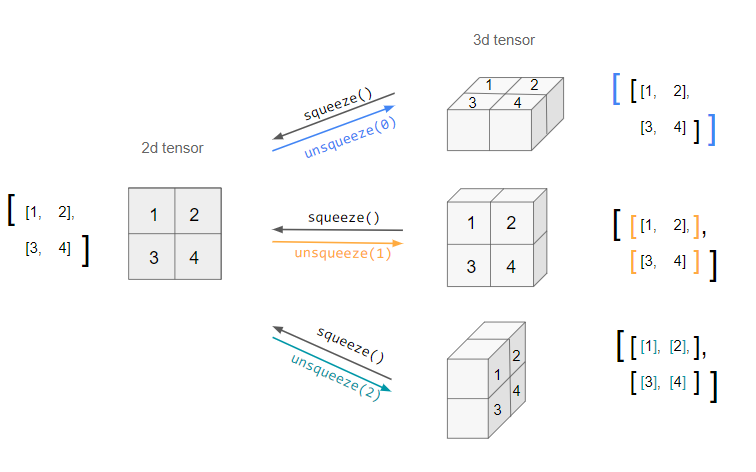

In [ ]:
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(16,16))

def getRankN(model, directory, ground_truth, N, show_images=True):

    onlyfiles = [ f for f in listdir(directory) if isfile(join(directory, f)) ]

    all_top_classes = []

    for (i, image_filename) in enumerate(onlyfiles):

        image = Image.open(directory+image_filename)

        image_tensor = test_transforms(image).float()
        #Adiciona uma dimensão extra  ("profundidade")
        image_tensor = image_tensor.unsqueeze_(0)
        input = Variable(image_tensor) #Não precisa mais, isso retorna um tensor pytorch
        input = input.to(device)
        output = model(input)
        #pegando as probabilidades
        prob = nnf.softmax(output, dim=1)
        top_p, top_class = prob.topk(N, dim = 1)
        top_classes_names = getClassNames(top_class)
        all_top_classes.append(top_classes_names)
        

        if show_images:

            sub = fig.add_subplot(len(onlyfiles), 1, i+1)
            x = " ,".join(top_classes_names)
            print(f"Top {N} Classes previstas: {x}")
            plt.axis("off")
            plt.imshow(image)
            plt.show()


    return getScore(all_top_classes, ground_truth, N)


def getScore(all_top_classes, ground_truth, N):
    #calcular rank-N score
    in_labels = 0
    for (i, labels) in enumerate(all_top_classes):
        if ground_truth[i] in labels:
            in_labels += 1
    print(f'Número correto de labels no top-{N}: {in_labels} de {len(all_top_classes)}')
    return f'Rank-{N} Accuracy = {in_labels/len(all_top_classes)*100:.2f}%'


<Figure size 1600x1600 with 0 Axes>

In [32]:
#criando a lista de ground truth

ground_truth = ['burrito',
                 'table lamp',
                 'bath towel',
                'basketball',
                'Christmas stocking',
                'beer_glass',
                'German shepherd, German shepherd dog, German police dog, alsatian',
                'limousine, limo',
                'collie',
                'soccer ball',
               "spider web, spider's web",
              
               ]

## Pegando o Rank-5

Top 5 Classes previstas: burrito ,bagel, beigel ,guacamole ,cheeseburger ,plate


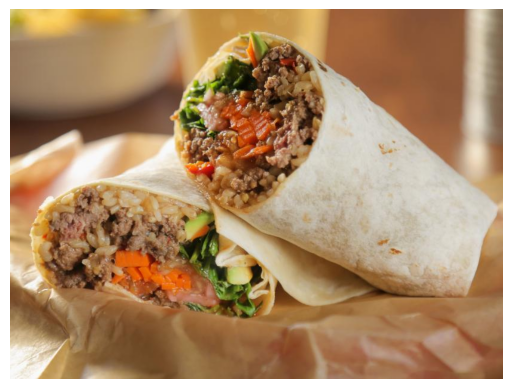

Top 5 Classes previstas: table lamp ,lampshade, lamp shade ,pedestal, plinth, footstall ,spotlight, spot ,electric fan, blower


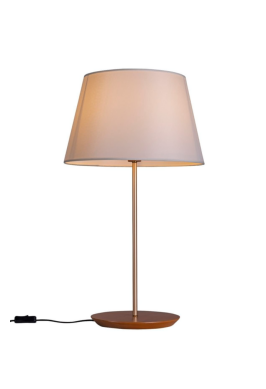

Top 5 Classes previstas: bath towel ,wool, woolen, woollen ,doormat, welcome mat ,envelope ,wallet, billfold, notecase, pocketbook


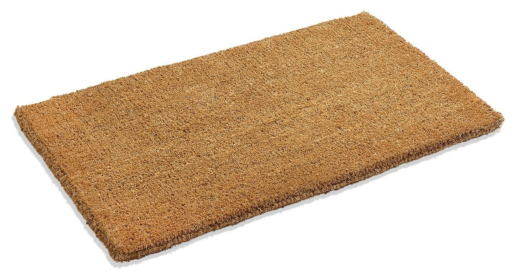

Top 5 Classes previstas: basketball ,face powder ,rugby ball ,tennis ball ,volleyball


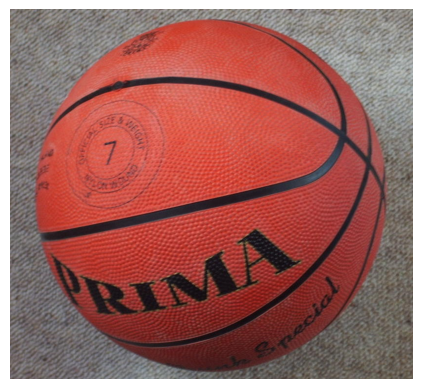

Top 5 Classes previstas: Christmas stocking ,pajama, pyjama, pj's, jammies ,purse ,apron ,safety pin


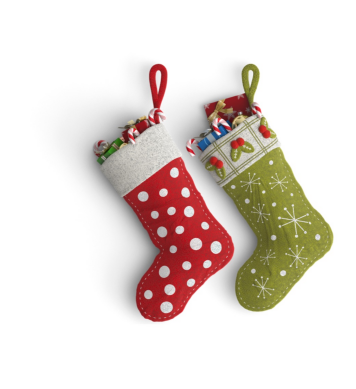

Top 5 Classes previstas: ice lolly, lolly, lollipop, popsicle ,Band Aid ,beaker ,pinwheel ,candle, taper, wax light


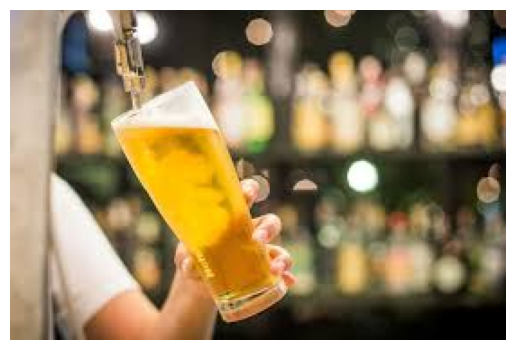

Top 5 Classes previstas: German shepherd, German shepherd dog, German police dog, alsatian ,Eskimo dog, husky ,Norwegian elkhound, elkhound ,Siberian husky ,kelpie


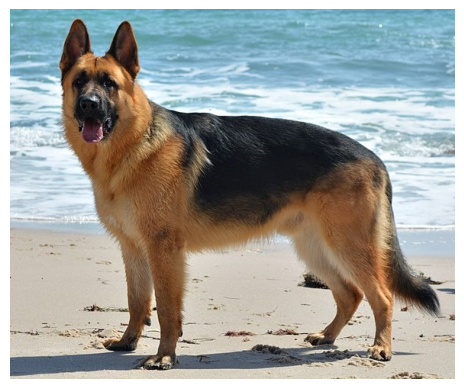

Top 5 Classes previstas: limousine, limo ,convertible ,minivan ,beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon ,bathtub, bathing tub, bath, tub


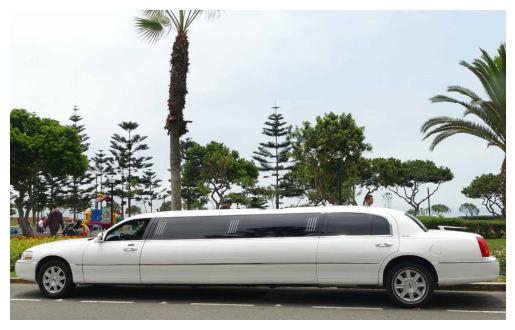

Top 5 Classes previstas: collie ,Shetland sheepdog, Shetland sheep dog, Shetland ,Samoyed, Samoyede ,Pomeranian ,white wolf, Arctic wolf, Canis lupus tundrarum


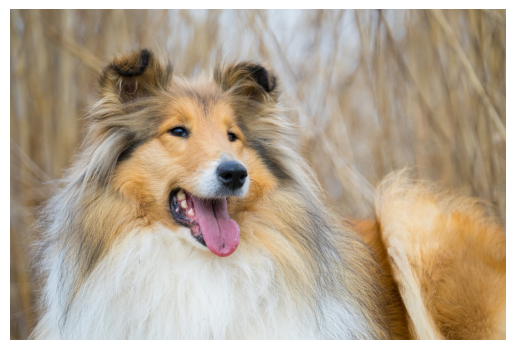

Top 5 Classes previstas: soccer ball ,volleyball ,toilet tissue, toilet paper, bathroom tissue ,piggy bank, penny bank ,ping-pong ball


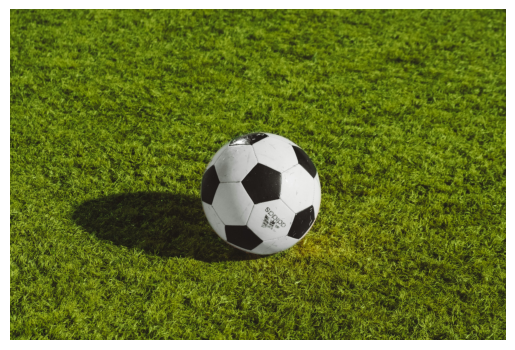

Top 5 Classes previstas: spider web, spider's web ,barn spider, Araneus cavaticus ,garden spider, Aranea diademata ,black and gold garden spider, Argiope aurantia ,wolf spider, hunting spider


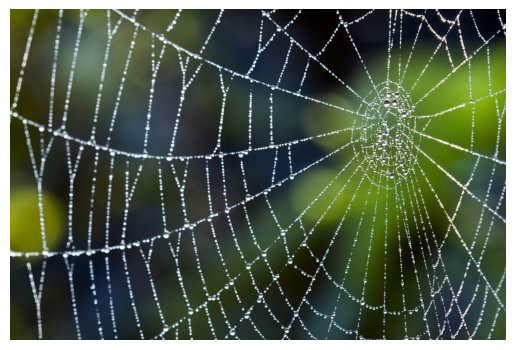

Número correto de labels no top-5: 10 de 11


'Rank-5 Accuracy = 90.91%'

In [35]:
getRankN(model,'./images/class1/', ground_truth, N=5)

## Pegando o Rank-1

Top 1 Classes previstas: burrito


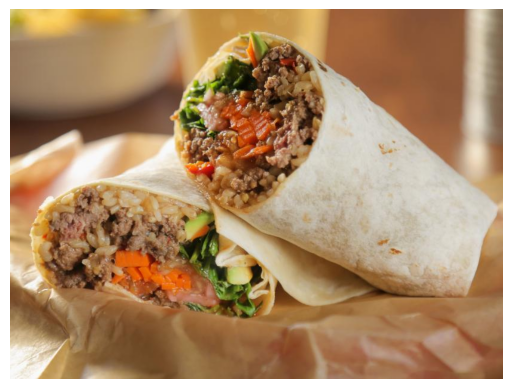

Top 1 Classes previstas: table lamp


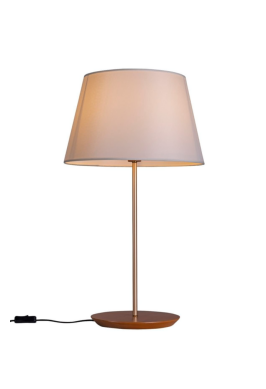

Top 1 Classes previstas: bath towel


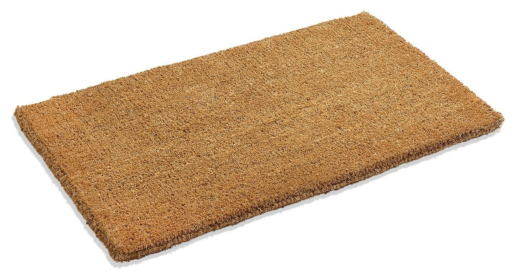

Top 1 Classes previstas: basketball


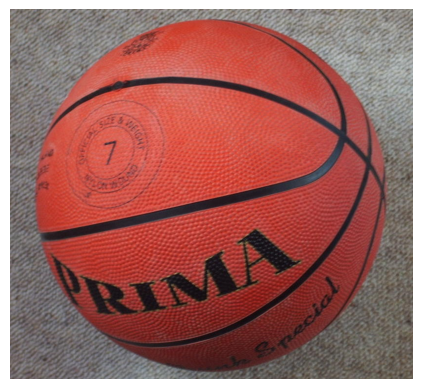

Top 1 Classes previstas: Christmas stocking


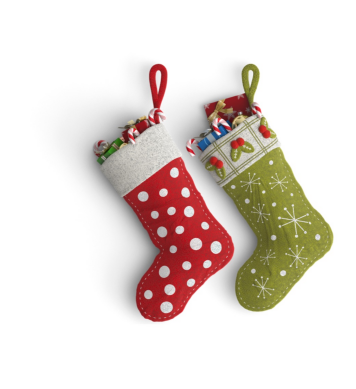

Top 1 Classes previstas: ice lolly, lolly, lollipop, popsicle


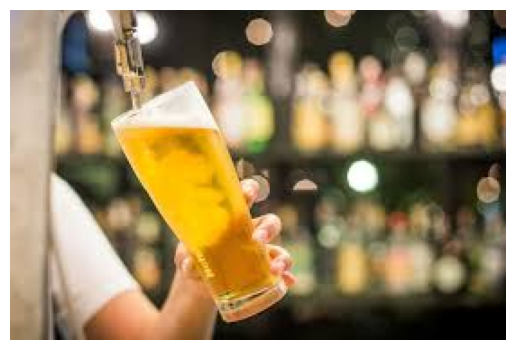

Top 1 Classes previstas: German shepherd, German shepherd dog, German police dog, alsatian


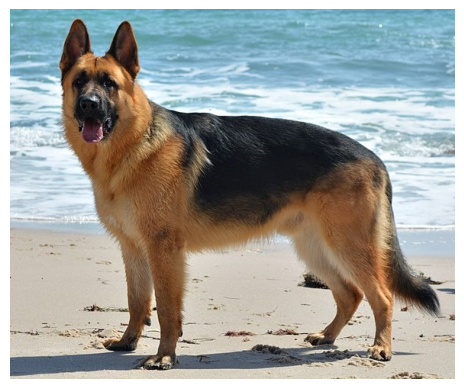

Top 1 Classes previstas: limousine, limo


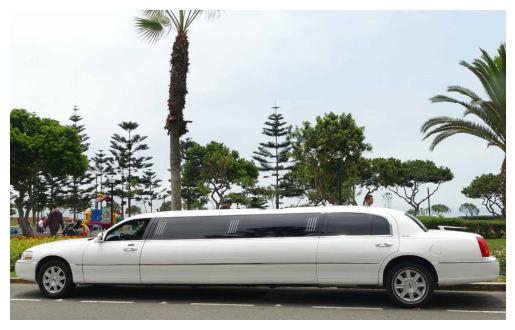

Top 1 Classes previstas: collie


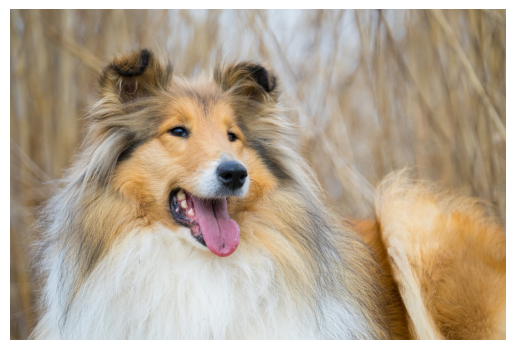

Top 1 Classes previstas: soccer ball


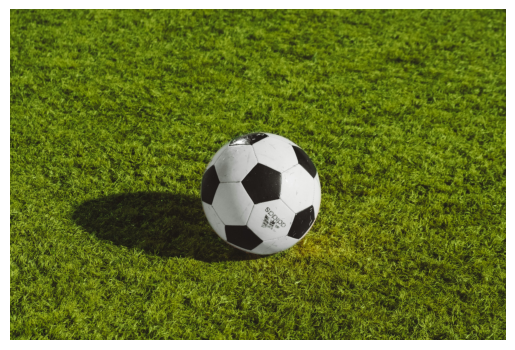

Top 1 Classes previstas: spider web, spider's web


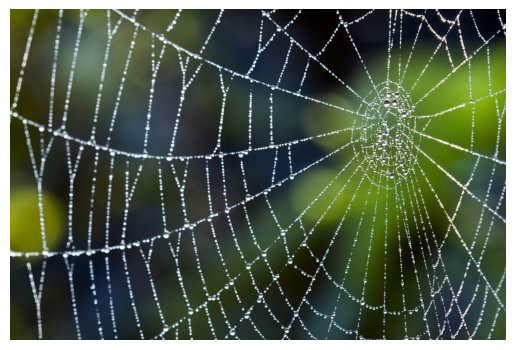

Número correto de labels no top-1: 10 de 11


'Rank-1 Accuracy = 90.91%'

In [34]:
getRankN(model,'./images/class1/', ground_truth, N=1)

## Pegando o Rank-10

Top 10 Classes previstas: burrito ,bagel, beigel ,guacamole ,cheeseburger ,plate ,French loaf ,hotdog, hot dog, red hot ,handkerchief, hankie, hanky, hankey ,dough ,ice cream, icecream


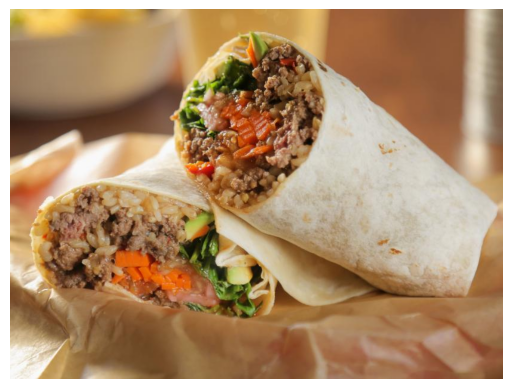

Top 10 Classes previstas: table lamp ,lampshade, lamp shade ,pedestal, plinth, footstall ,spotlight, spot ,electric fan, blower ,hook, claw ,desk ,paper towel ,loudspeaker, speaker, speaker unit, loudspeaker system, speaker system ,dining table, board


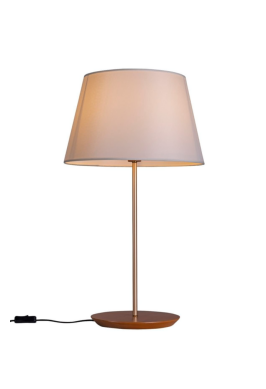

Top 10 Classes previstas: bath towel ,wool, woolen, woollen ,doormat, welcome mat ,envelope ,wallet, billfold, notecase, pocketbook ,handkerchief, hankie, hanky, hankey ,carton ,pencil box, pencil case ,book jacket, dust cover, dust jacket, dust wrapper ,binder, ring-binder


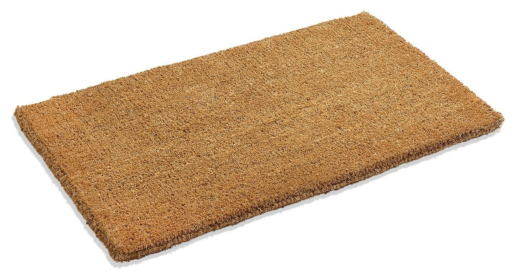

Top 10 Classes previstas: basketball ,face powder ,rugby ball ,tennis ball ,volleyball ,bottlecap ,ping-pong ball ,puck, hockey puck ,lotion ,sunscreen, sunblock, sun blocker


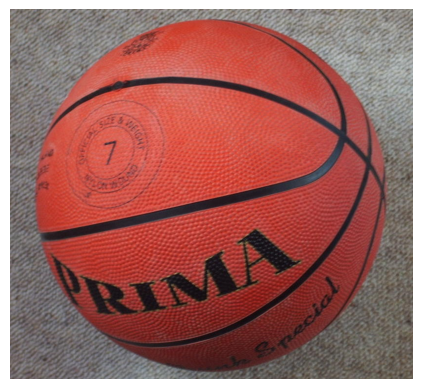

Top 10 Classes previstas: Christmas stocking ,pajama, pyjama, pj's, jammies ,purse ,apron ,safety pin ,diaper, nappy, napkin ,hair slide ,bib ,sock ,mailbag, postbag


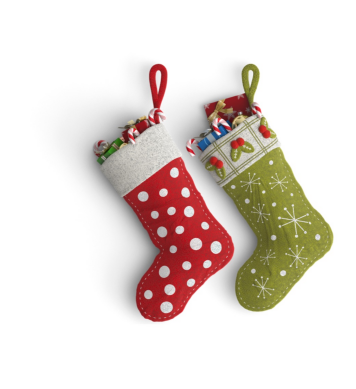

Top 10 Classes previstas: ice lolly, lolly, lollipop, popsicle ,Band Aid ,beaker ,pinwheel ,candle, taper, wax light ,plastic bag ,spatula ,lab coat, laboratory coat ,nipple ,syringe


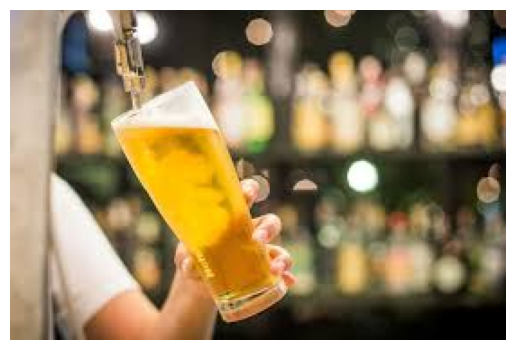

Top 10 Classes previstas: German shepherd, German shepherd dog, German police dog, alsatian ,Eskimo dog, husky ,Norwegian elkhound, elkhound ,Siberian husky ,kelpie ,white wolf, Arctic wolf, Canis lupus tundrarum ,malamute, malemute, Alaskan malamute ,malinois ,dingo, warrigal, warragal, Canis dingo ,Labrador retriever


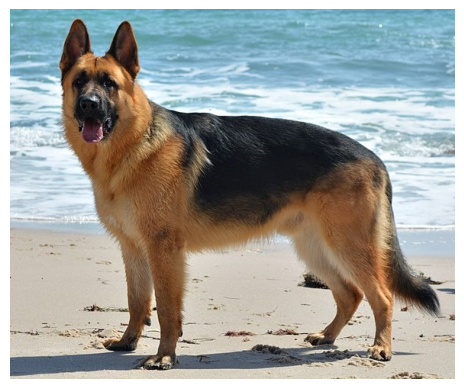

Top 10 Classes previstas: limousine, limo ,convertible ,minivan ,beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon ,bathtub, bathing tub, bath, tub ,tub, vat ,car wheel ,pickup, pickup truck ,sports car, sport car ,grille, radiator grille


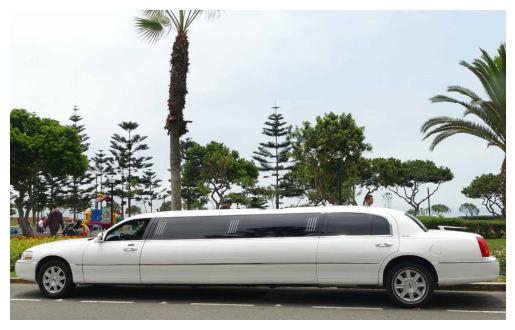

Top 10 Classes previstas: collie ,Shetland sheepdog, Shetland sheep dog, Shetland ,Samoyed, Samoyede ,Pomeranian ,white wolf, Arctic wolf, Canis lupus tundrarum ,Arctic fox, white fox, Alopex lagopus ,papillon ,Border collie ,Eskimo dog, husky ,Great Pyrenees


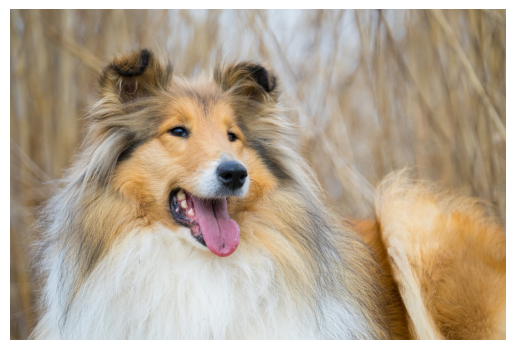

Top 10 Classes previstas: soccer ball ,volleyball ,toilet tissue, toilet paper, bathroom tissue ,piggy bank, penny bank ,ping-pong ball ,golf ball ,dumbbell ,soap dispenser ,mouse, computer mouse ,tennis ball


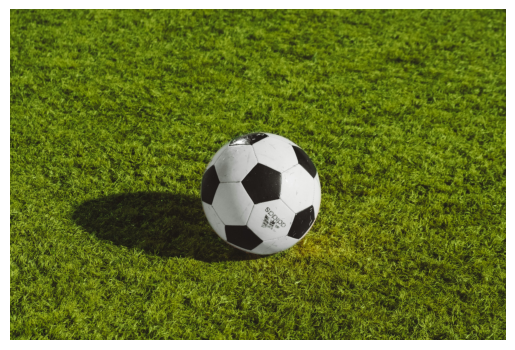

Top 10 Classes previstas: spider web, spider's web ,barn spider, Araneus cavaticus ,garden spider, Aranea diademata ,black and gold garden spider, Argiope aurantia ,wolf spider, hunting spider ,black widow, Latrodectus mactans ,jellyfish ,matchstick ,bubble ,chain


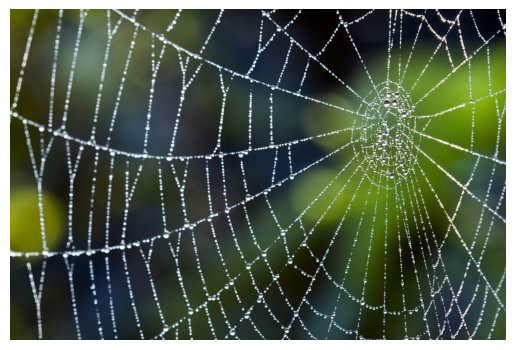

'Rank-10 Accuracy = 90.91%'

In [30]:
getRankN(model,'./images/class1/', ground_truth, N=10)